In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [6]:
df=pd.read_csv('mnist_train.csv')

In [7]:
df

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59997,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
df.sample()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
47825,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [15]:
# label is 5 it means the value is 5 in the pixcel

In [10]:
df.shape

(60000, 785)

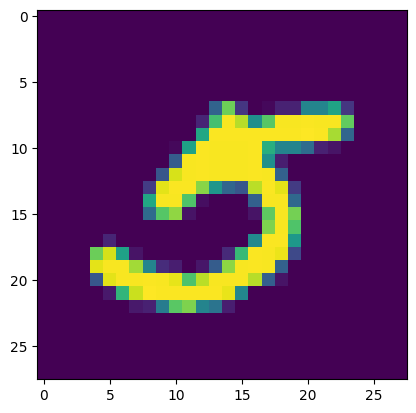

In [14]:
plt.imshow(df.iloc[47825, 1:].values.reshape(28,28))

## Model Traing Without PCA

In [54]:
X_train=df.iloc[:,1: ]
y_train=df.iloc[:, 0]

In [55]:
X_train.shape, y_train.shape

((60000, 784), (60000,))

In [56]:
df_test=pd.read_csv('mnist_test.csv')

In [57]:
df_test.shape

(10000, 785)

In [58]:
X_test=df_test.iloc[:, 1:]
y_test=df_test.iloc[:, 0]

In [59]:
X_test.shape, y_test.shape

((10000, 784), (10000,))

In [60]:
from sklearn.neighbors import KNeighborsClassifier

In [61]:
knn=KNeighborsClassifier()

In [62]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [63]:
import time
start=time.time()
y_pred=knn.predict(X_test)
end=time.time()

print(end-start)

29.730897188186646


In [64]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.9688

## Same thing using PCA

In [65]:
# step 1
from sklearn.preprocessing import StandardScaler

In [66]:
scaler=StandardScaler()

In [67]:
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [128]:
# PCA
from sklearn.decomposition import PCA
pca=PCA(n_components=40)  # n_components=None it means no of pc=no of columns

In [129]:
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

# here we calculate eighen value and eighen vector and tranform data on different cordinate system

In [130]:
X_train.shape

(60000, 784)

In [131]:
X_train_trf.shape

(60000, 40)

In [132]:
knn=KNeighborsClassifier()
knn.fit(X_train_trf, y_train)

KNeighborsClassifier()

In [133]:
y_pred=knn.predict(X_test_trf)

In [134]:
accuracy_score(y_test, y_pred)

0.9583

In [136]:
for i in range(1,785): 
    pca=PCA(n_components=i)
    X_train_trf=pca.fit_transform(X_train)
    X_test_trf=pca.transform(X_test)

    knn=KNeighborsClassifier()
    knn.fit(X_train_trf, y_train)
    
    y_pred=knn.predict(X_test_trf)
    print(f"for n _components={i} acc={accuracy_score(y_test, y_pred)}")


# I found max accuracy: for n _components=49 acc=0.9587

for n _components=1 acc=0.2564
for n _components=2 acc=0.3199
for n _components=3 acc=0.5193
for n _components=4 acc=0.6682
for n _components=5 acc=0.7378
for n _components=6 acc=0.8353
for n _components=7 acc=0.8458
for n _components=8 acc=0.8763
for n _components=9 acc=0.8906
for n _components=10 acc=0.9073
for n _components=11 acc=0.9156
for n _components=12 acc=0.9205
for n _components=13 acc=0.929
for n _components=14 acc=0.9361
for n _components=15 acc=0.9394
for n _components=16 acc=0.9394
for n _components=17 acc=0.9416
for n _components=18 acc=0.9422
for n _components=19 acc=0.9462
for n _components=20 acc=0.9458
for n _components=21 acc=0.9451
for n _components=22 acc=0.9476
for n _components=23 acc=0.9483
for n _components=24 acc=0.9494
for n _components=25 acc=0.9485
for n _components=26 acc=0.9483
for n _components=27 acc=0.9508
for n _components=28 acc=0.9517
for n _components=29 acc=0.9504
for n _components=30 acc=0.9525
for n _components=31 acc=0.9531
for n _components=

KeyboardInterrupt: 

## for visualization

In [139]:
# transforming to a 2D coordinate system
pca=PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [140]:
X_train_trf

array([[-0.9221408 , -4.81442891],
       [ 8.70896785, -7.75454087],
       [ 2.32837854,  9.43104436],
       ...,
       [-3.77721272, -3.23049251],
       [ 1.72235014, -4.94829021],
       [-1.42721779, -6.17524744]])

In [149]:
import plotly.express as px

px.scatter(x=X_train_trf[:,0], y=X_train_trf[:,1], color=y_train, width=1000, height=600)

In [150]:
# transforming to a 3D coordinate system
pca=PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [151]:
X_train_trf

array([[-9.22196313e-01, -4.81466875e+00,  6.80569609e-02],
       [ 8.70900952e+00, -7.75419989e+00, -3.44860703e+00],
       [ 2.32832057e+00,  9.43122570e+00, -6.18198015e+00],
       ...,
       [-3.77721068e+00, -3.23090125e+00, -3.80563348e+00],
       [ 1.72242092e+00, -4.94803842e+00,  6.05955881e-03],
       [-1.42728520e+00, -6.17522536e+00, -2.96757340e+00]])

In [152]:
pca.explained_variance_ratio_
# it means eigen value 1 ke corrospondign eigen vector original data 5.6 % variance explain kr rha h
# 0.05646717=lembda1/(lemda1+lemda2+lemda3+...)

# it means these three vector 13 % is explaining the variance of original data
# we need 90% variance should be explained (rule)

array([0.05646717, 0.04078272, 0.0373938 ])

In [153]:
pca.explained_variance_
# this is the Eigen values

array([40.48763511, 29.24169747, 26.81180426])

In [159]:
pca.components_
# eighen vectors

array([[ 4.49237148e-19, -3.76764500e-19,  1.35377489e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 1.43605414e-17,  2.96984738e-18, -2.55586861e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 6.88998288e-17, -1.53868348e-17, -2.98263100e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [160]:
pca.components_.shape
# 3 eigen vector 784 dimension

(3, 784)

In [158]:
import plotly.express as px

fig=px.scatter_3d(x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],color=y_train, width=1000, height=600)
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20))
fig.show()

## Finding optimal number of principle components

In [162]:
pca=PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [163]:
pca.explained_variance_.shape

(784,)

In [164]:
pca.components_

array([[-3.85011588e-20, -2.08166817e-17, -5.55111512e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-2.78333381e-19, -1.11022302e-16,  1.11022302e-16, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 4.25944523e-21,  4.33680869e-18,  2.51534904e-17, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [ 0.00000000e+00,  6.73052118e-02,  2.05076827e-02, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-0.00000000e+00, -1.06630868e-01,  2.75793713e-02, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-0.00000000e+00, -5.77669196e-02,  2.85414812e-02, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [165]:
pca.components_.shape

(784, 784)

In [166]:
pca.explained_variance_ratio_

array([5.64671692e-02, 4.07827199e-02, 3.73938042e-02, 2.88511485e-02,
       2.52110863e-02, 2.19426996e-02, 1.92334439e-02, 1.74579923e-02,
       1.53509230e-02, 1.40171960e-02, 1.34174302e-02, 1.20374194e-02,
       1.11456955e-02, 1.08992356e-02, 1.02864922e-02, 9.94486564e-03,
       9.36383280e-03, 9.21045666e-03, 8.93436778e-03, 8.69912619e-03,
       8.27363019e-03, 8.03417369e-03, 7.64845500e-03, 7.41772464e-03,
       7.15292868e-03, 6.91846831e-03, 6.84135964e-03, 6.56674546e-03,
       6.31676724e-03, 6.12919839e-03, 5.96255295e-03, 5.87716416e-03,
       5.71591699e-03, 5.62307416e-03, 5.54682002e-03, 5.38418374e-03,
       5.31182250e-03, 5.19605602e-03, 5.08211255e-03, 4.80005571e-03,
       4.76455820e-03, 4.69139360e-03, 4.54348956e-03, 4.51345787e-03,
       4.46963401e-03, 4.43383155e-03, 4.38215469e-03, 4.30381751e-03,
       4.26877901e-03, 4.23647017e-03, 4.04696121e-03, 3.99447403e-03,
       3.97456119e-03, 3.93820800e-03, 3.85813590e-03, 3.79042674e-03,
      

In [167]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05646717, 0.09724989, 0.13464369, 0.16349484, 0.18870593,
       0.21064863, 0.22988207, 0.24734006, 0.26269099, 0.27670818,
       0.29012561, 0.30216303, 0.31330873, 0.32420796, 0.33449446,
       0.34443932, 0.35380315, 0.36301361, 0.37194798, 0.3806471 ,
       0.38892074, 0.39695491, 0.40460336, 0.41202109, 0.41917402,
       0.42609249, 0.43293384, 0.43950059, 0.44581736, 0.45194656,
       0.45790911, 0.46378627, 0.46950219, 0.47512526, 0.48067208,
       0.48605627, 0.49136809, 0.49656415, 0.50164626, 0.50644631,
       0.51121087, 0.51590227, 0.52044576, 0.52495921, 0.52942885,
       0.53386268, 0.53824483, 0.54254865, 0.54681743, 0.5510539 ,
       0.55510086, 0.55909534, 0.5630699 , 0.56700811, 0.57086624,
       0.57465667, 0.57841069, 0.58211845, 0.5857679 , 0.5893609 ,
       0.59288472, 0.59636266, 0.59980677, 0.60320546, 0.606565  ,
       0.60991386, 0.6132325 , 0.61646276, 0.61962553, 0.62275797,
       0.62586528, 0.62893771, 0.63198685, 0.63501403, 0.63800

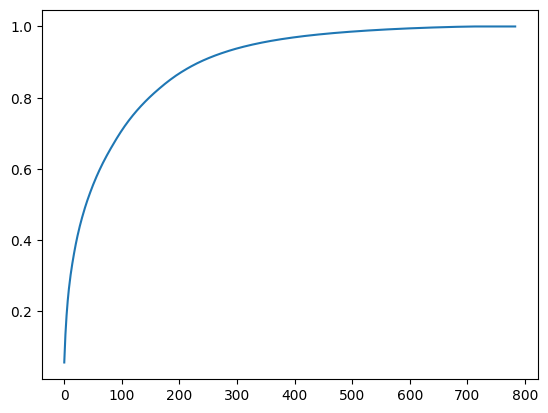

In [168]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [169]:
# insight>> we need almost 250 principle components to explained 90 % variance of the original data

In [170]:
# Thanks